In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import tables
import mpld3
mpld3.enable_notebook()

In [49]:
class Spectrum(object):

    def __init__(self, wavelength, flux):
        self.wavelength = wavelength
        self.flux = flux
        self.flux /= np.median(self.flux)
    
    def show(self):
        plt.plot(self.wavelength, self.flux)
        idx = int(len(self.flux) * 0.1)
        lo_lim = np.partition(self.flux, idx)[idx]
        idx = int(len(self.flux) * 0.9)
        hi_lim = np.partition(self.flux, idx)[idx]
        lo_lim = lo_lim - (hi_lim - lo_lim) / 8 * 4
        hi_lim = hi_lim + (hi_lim - lo_lim) / 8 * 4
        plt.ylim(lo_lim, hi_lim)
        
    def trim(self, wv_lo=None, wv_hi=None):
        if wv_lo is None:
            wv_lo = self.wavelength.min()
        if wv_hi is None:
            wv_hi = self.wavelength.max()
        idx = np.logical_and(self.wavelength >= wv_lo, 
                             self.wavelength <= wv_hi)
        self.wavelength = self.wavelength[idx]
        self.flux = self.flux[idx]
        self.flux /= np.median(self.flux)
        
    @staticmethod
    def ReadMarshalSpec(filename):
        data = np.genfromtxt(filename, names=["wavelength", "flux"])
        return Spectrum(data["wavelength"], data["flux"])

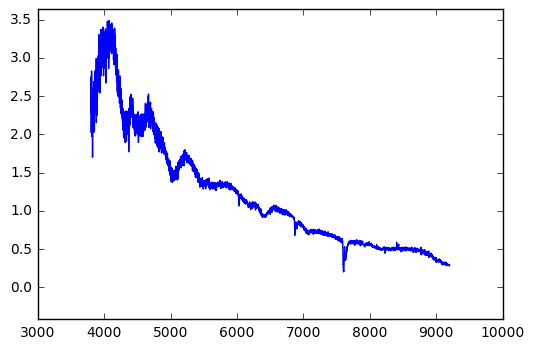

In [19]:
spec = Spectrum.ReadMarshalSpec("16abc_20160405_Gemini_N_v1.ascii")
spec.show()

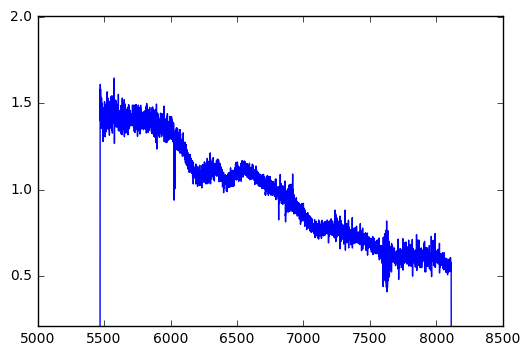

In [20]:
spec = Spectrum.ReadMarshalSpec("16abc_20160406_Keck2_v1.ascii")
spec.show()

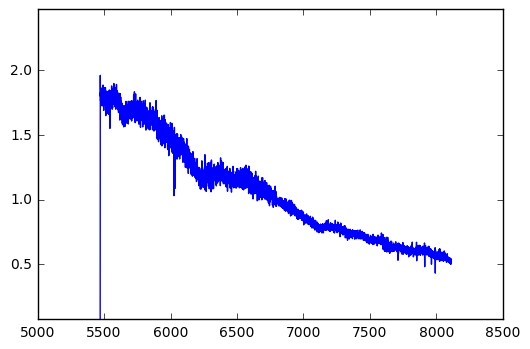

In [21]:
spec = Spectrum.ReadMarshalSpec("16abc_20160408_Keck2_v2.ascii")
spec.show()

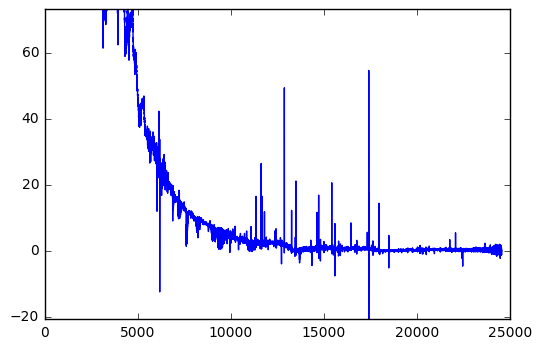

In [22]:
spec = Spectrum.ReadMarshalSpec("16abc_20160414_VLT_v1.ascii")
spec.show()

In [38]:
ls

16abc_20160405_DCT_v1.ascii       16abc_20160430_FTN_v1.ascii
16abc_20160405_FTN_v1.ascii       16abc_20160510_Keck1_v2.ascii
16abc_20160405_Gemini_N_v1.ascii  16abc_20160510_Keck1_v2.sfo
16abc_20160406_Keck2_v1.ascii     16abc_20160512_VLT_v1.ascii
16abc_20160408_Keck2_v2.ascii     16abc_20160517_P60_v1.ascii
16abc_20160410_Keck1_v1.ascii     16abc_20160521_FTN_v1.ascii
16abc_20160411_FTN_v1.ascii       16abc_20160603_FTN_v1.ascii
16abc_20160412_FTN_v1.ascii       16abc_20160611_FTN_v1.ascii
16abc_20160413_FTS_v1.ascii       16abc_20160623_FTN_v1.ascii
16abc_20160414_VLT_v1.ascii       LineVelocities.ipynb
16abc_20160416_VLT_v1.ascii       SpectraCleanUp.ipynb
16abc_20160425_FTN_v1.ascii       SupernovaRedshift.ipynb
16abc_20160428_NOT_v1.ascii       sf_command.txt
16abc_20160428_NOT_v1.sfo         spec.tar.gz


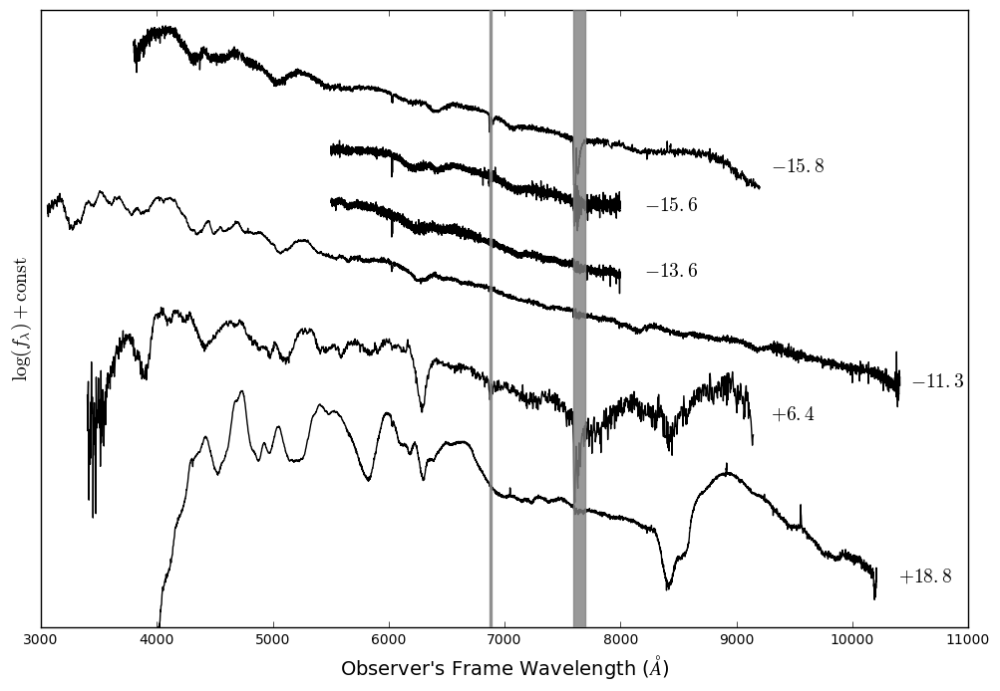

In [89]:
offset = 1.0

plt.figure(figsize=(12,8))

spec = Spectrum.ReadMarshalSpec("16abc_20160405_Gemini_N_v1.ascii")
plt.plot(spec.wavelength, np.log(spec.flux), color='k')
plt.text(9300, -1.0, "$-15.8$", fontsize=14)

spec = Spectrum.ReadMarshalSpec("16abc_20160406_Keck2_v1.ascii")
spec.trim(wv_lo=5500, wv_hi=8000)
plt.plot(spec.wavelength, np.log(spec.flux) - 1 * offset, color='k')
plt.text(8200, -1.6, "$-15.6$", fontsize=14)

spec = Spectrum.ReadMarshalSpec("16abc_20160408_Keck2_v2.ascii")
spec.trim(wv_lo=5500, wv_hi=8000)
plt.plot(spec.wavelength, np.log(spec.flux) - 2 * offset, color='k')
plt.text(8200, -2.6, "$-13.6$", fontsize=14)

spec = Spectrum.ReadMarshalSpec("16abc_20160410_Keck1_v1.ascii")
plt.plot(spec.wavelength, np.log(spec.flux) - 3 * offset, color='k')
plt.text(10500, -4.3, "$-11.3$", fontsize=14)

spec = Spectrum.ReadMarshalSpec("16abc_20160428_NOT_v1.ascii")
plt.plot(spec.wavelength, np.log(spec.flux) - 4 * offset, color='k')
plt.text(9300, -4.8, "$+6.4$", fontsize=14)

spec = Spectrum.ReadMarshalSpec("16abc_20160510_Keck1_v2.ascii")
spec.trim(wv_lo=4000)
plt.plot(spec.wavelength, np.log(spec.flux) - 6 * offset, color='k')
plt.text(10400, -7.3, "$+18.8$", fontsize=14)

y1, y2 = plt.ylim()
plt.fill_between(x=[7594, 7700], y1=y1, y2=y2, color='gray', alpha=0.8, zorder=9)
plt.fill_between(x=[6867, 6884], y1=y1, y2=y2, color='gray', alpha=0.8, zorder=9)

plt.ylim(-8, 1.5)

plt.yticks([])
plt.xlabel("Observer's Frame Wavelength ($\\AA$)", fontsize=14)
plt.ylabel("$\\log(f_\\lambda)+\\rm{const}$", fontsize=14)
plt.savefig('spec_sequence.pdf')

In [41]:
spec.flux

array([ 0.        ,  0.00539527, -0.03312066, ..., -0.00957916,
        0.00121624,  0.00013477])